# Analysing My Strava Activities with APIs

# Getting our Data

The purpose of this project is to explore my sports activity patterns througohut the last year. I like to go for long runs, practice sports such as tennis and padel, and sometimes go to the gym when it's rainy outside. The platform that I use to keep track of my physical activities is Strava, an American internet service for tracking physical exercise which also has the features of a social media. It's a nice platform where I can look back at my average pace of my fast runs, look at the maps of my long runs, and get motivated by receiving kudos from my friends and vice versa!

In order to analyse my activity on my JupyterLab, I need to scrape the APIs from Strava and upload the data on my local. I read [this](https://towardsdatascience.com/using-the-strava-api-and-pandas-to-explore-your-activity-data-d94901d9bfde) online article which helped me in the process of downloading the necessary tools to test Strava APIs, getting access and refresh tokens, and finally getting the data with Python. Would highly recommend to anybody who's new with API and would like to give it a go. 

Once I've done that, I then started exploring my data through publicly available libraries such as Pandas and NumPy. After having cleansed my data, I aimed at answering the following questions:

- What's the most frequent activity that I've performed in the past six months?
- What's the most common run distance I've performed in the past few years?
- Has my average pace decreased during my fast, 5km runs throughout the past year?
- In which country/ county did I exercise the most in the past years?

## Create some Visualizations to Explore my Data

In [1]:
import calendar
from datetime import datetime
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np
import os 
import pandas as pd
import seaborn as sns

In [2]:
import requests
import urllib3
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

auth_url = "https://www.strava.com/oauth/token" 
activites_url = "https://www.strava.com/api/v3/athlete/activities"

# creating a dictionary to store our my IDs and other info in key-value pairs 
payload = {
    'client_id': "111330",
    'client_secret': 'db75227de1fa38f856b4ce323affe796687943ef',
    'refresh_token': '186b85fbbff3960fcfb5ec338fac12cb356611ce',
    'grant_type': "refresh_token",
    'f': 'json'
}

print("Requesting Token...\n")
res = requests.post(auth_url, data=payload, verify=False) # posting a request and assigning it to a variable 
access_token = res.json()['access_token'] # extracting the value of the key 'access_token' in the dictionary 
print("Access Token = {}\n".format(access_token)) # printing the access token 

header = {'Authorization': 'Bearer ' + access_token}
param = {'per_page': 200, 'page': 1}
my_dataset = requests.get(activites_url, headers=header, params=param).json() # storing all my activity data in a variable named my_dataset 

print(my_dataset[0]["name"])
print(my_dataset[0]["map"]["summary_polyline"])

Requesting Token...

Access Token = 4df83fd2e8e90911c615f7dcdcceb1edb43b5cf2

Morning Yoga



# Data Exploration and Cleansing

In [3]:
# Creating a dataframe
df = pd.DataFrame(my_dataset)

In [4]:
# Dropping unnecessary columns
df = df.drop(['resource_state', 'athlete', 'type', 'workout_type', 'id', 'start_date_local', 'utc_offset', 'location_state', 'location_country', 'trainer', 'commute', 'private', 'flagged', 'gear_id', 'display_hide_heartrate_option', 'upload_id', 'upload_id_str', 'external_id',
       'from_accepted_tag', 'average_watts', 'kilojoules', 'device_watts', 'average_cadence', 'has_heartrate',
       'heartrate_opt_out', 'elapsed_time', 'timezone', 'location_city'], axis=1)

### Cleansing the Moving Time Column

In [5]:
# Converting the time value to hours, minutes, seconds
def convert_to_hhmmss(moving_time): # Creating a function that takes in as input a moving time 
    total_seconds = int(moving_time)
    hours = total_seconds // 3600
    minutes = (total_seconds % 3600) // 60
    seconds = total_seconds % 60
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

In [6]:
# Applying the function to the 'moving_time' column
df['moving_time'] = df['moving_time'].apply(convert_to_hhmmss)

### Cleansing the Start Date Column

In [7]:
# Splitting the 'start_date' column into date, month, and time
df['start_date'] = pd.to_datetime(df['start_date']) # converting the column to datetime format 
df['date'] = df['start_date'].dt.date # extracting the date
df['month'] = df['start_date'].dt.month # extracting the month
df['year'] = df['start_date'].dt.year # extracting the year
df['time'] = df['start_date'].dt.time # extracting the time

In [8]:
# Dropping the original 'start_date' column
df.drop(columns=['start_date'], inplace=True)

### Cleansing the Month Column

In [9]:
# Swapping numeric 'month' with its corresponding name
df['month'] = df['month'].apply(lambda x: calendar.month_name[x]) # converting numeric month to month names

In [10]:
# Defining the custom month order
custom_month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August']

# Converting the 'month' column to categorical with custom order
df['month'] = pd.Categorical(df['month'], categories=custom_month_order, ordered=True)

# Sorting the DataFrame based on categorical order
df = df.sort_values('month')

### Cleansing the Sport Type Column

In [11]:
# Replacing 'Weight Training' with 'Workout' to reduce the amount of 'sport_type'(s)
df['sport_type'] = df['sport_type'].replace('WeightTraining', 'Workout')

### Cleansing the Distance Column

In [12]:
# Converting metres to km
df['distance_km'] = df['distance'] / 1000

# Dropping the original 'distance' column 
df.drop(columns=['distance'], inplace=True)

# Rounding the distances  
df['distance_km'] = df['distance_km'].round()

### Cleansing the Total Elevation Gain Column

In [13]:
# Removing 'total' from 'total_elevation_gain'
target_column = 'total_elevation_gain'
new_column_name = target_column.replace('total_', '')
df.rename(columns={target_column: new_column_name}, inplace=True)

# Data Visualization

### Creating a Sport by Month Frequency Table

Now that we've cleansed the data, we can aim at answering the first of our research questions: 'What's the most frequent activity that I've performed in the past six months?'

In [14]:
# Filtering data based on the 'year' column
year_to_filter = 2023
filtered_df = df[df['year'] == year_to_filter]

In [15]:
# Calculating the frequency of sports practiced by month 
frequency_table = filtered_df.groupby(['sport_type', 'month']).size().unstack(fill_value=0) # adding size to count the occurrences. filling missing values with 'unstack' 

In [16]:
frequency_table

month,January,February,March,April,May,June,July,August
sport_type,,,,,,,,
Badminton,0,0,0,0,0,0,0,1
HighIntensityIntervalTraining,0,0,0,0,0,0,0,0
Racquetball,0,0,0,0,0,0,2,1
Ride,0,0,1,0,0,0,0,3
Run,5,10,11,11,13,3,7,3
Swim,0,0,0,0,0,0,0,1
Tennis,0,0,0,0,0,0,0,4
Walk,0,0,1,0,0,0,0,1
Workout,0,0,0,0,0,0,0,3


We've created our first frequency table to check how often I've practiced my physical activities in the last 6 month. It would be easier to be able to quickly assess which sport is the one I've practiced more. We'll do that by creating a new column named 'total' and sort all values from biggest to smallest. 

In [17]:
# Creating a 'total' column to sort all values from biggest to smallest  
frequency_table['total'] = frequency_table.sum(axis=1)
frequency_table.sort_values('total', inplace=True, ascending=False) # Sorting the values in the total column
frequency_table.drop(columns=["total"], inplace=True) # the total column is not needed anymore 
frequency_table # displaying the new, sorted frequency table to see how it looks like

month,January,February,March,April,May,June,July,August
sport_type,,,,,,,,
Run,5,10,11,11,13,3,7,3
Ride,0,0,1,0,0,0,0,3
Tennis,0,0,0,0,0,0,0,4
Racquetball,0,0,0,0,0,0,2,1
Workout,0,0,0,0,0,0,0,3
Walk,0,0,1,0,0,0,0,1
Badminton,0,0,0,0,0,0,0,1
Swim,0,0,0,0,0,0,0,1
HighIntensityIntervalTraining,0,0,0,0,0,0,0,0


Now we can quickly see that the most frequent activity was running. Let's now use this frequency table to create a grouped bar chart.

<function matplotlib.pyplot.show(close=None, block=None)>

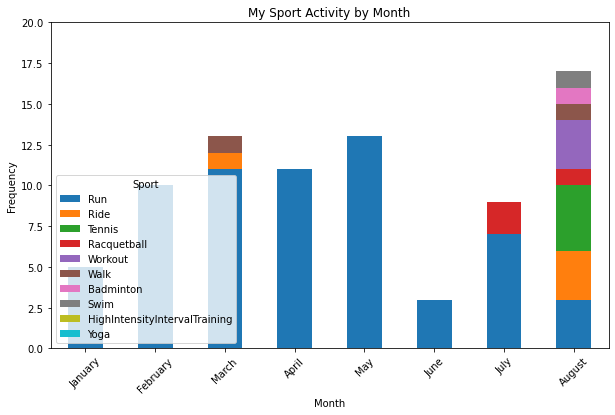

In [18]:
# Plotting the table into a grouped bar chart
frequency_table.T.plot(kind='bar', stacked=True, figsize=(10,6))
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.ylim(0, 20) # setting the y-axis limit
plt.title('My Sport Activity by Month') # setting a title 
plt.legend(title='Sport')
plt.xticks(rotation=45) # choosing the rotation of the ticks labels 
plt.show

As mentioned above, it looks like runs are the activity which took place the most in the first half of 2023. The month with the highest number of runs is May. This might be because I was training for a Trail Half Marathon which took place at the beginning of June. This could also explain why the month with the lowest amount of run activities was June, since I was going through post-race recovery. We can also observe the diversity in sports which took place in August. This might be because of the nice weather thus the multiple activities which can be practiced outdoor. 

# Exploring Runs

Let's now explore the runs. More specifically, it would be good to explore how my distance in runs has changed throughout the past few years. As for running, I have actually started way before January 2023, so now I'm going to use the original dataframe to also include all the runs I did before 2023. This will help us answer our second research question: "What's the most common run distance I've performed in the past few years?"

In [19]:
# Filtering the dataframe to only select runs activities 
run_df = df[df['sport_type'] == 'Run']

In [20]:
# Defining bin intervals for my run's distances
bins = [0, 5, 10, 15, 20, 25, 30]

# Creating bins using the cut function
run_df['distance_bins'] = pd.cut(run_df['distance_km'], bins=bins, labels=["0-5", "5-10", "10-15", "15-20", "20-25", "25-30"])

/var/folders/qs/fdrj_gks73v_3fn5zbpyl2000000gn/T/ipykernel_93572/2358565261.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  run_df['distance_bins'] = pd.cut(run_df['distance_km'], bins=bins, labels=["0-5", "5-10", "10-15", "15-20", "20-25", "25-30"])


In [21]:
# Calculating basic statistics
mean_distance = run_df['distance_km'].mean()
median_distance = run_df['distance_km'].median()
std_distance = run_df['distance_km'].std()

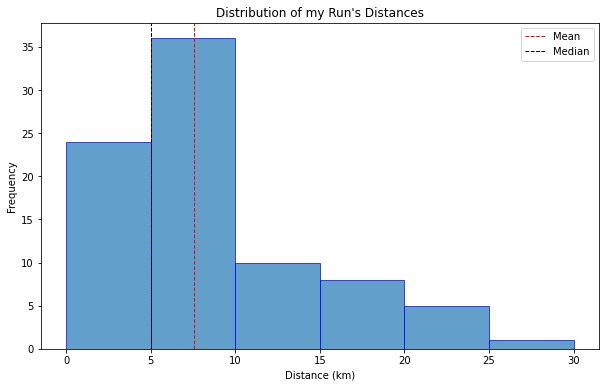

In [22]:
# Plotting a histogram
plt.figure(figsize=(10,6))
plt.hist(run_df['distance_km'], bins=bins, edgecolor='Blue', alpha=0.7)

# Adding vertical lines for mean and median
plt.axvline(mean_distance, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(median_distance, color='black', linestyle='dashed', linewidth=1, label='Median')

# Setting labels and title
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.title('Distribution of my Run\'s Distances')
plt.legend()

# Displaying the plot
plt.show()

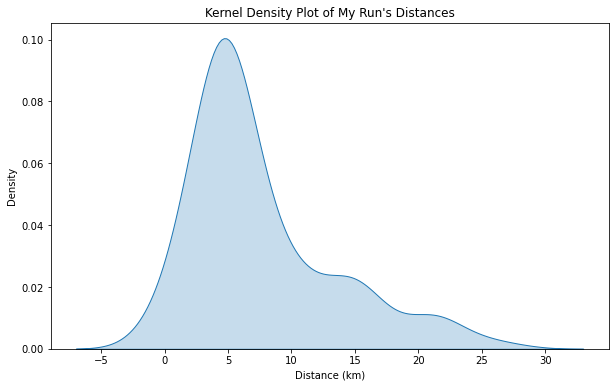

In [23]:
# Creating a kernel density plot
plt.figure(figsize=(10, 6))
sns.kdeplot(run_df['distance_km'], shade=True)

# Set labels and title
plt.xlabel('Distance (km)')
plt.ylabel('Density')
plt.title('Kernel Density Plot of My Run\'s Distances')

# Display the plot
plt.show()

As shown by the plots above, the distribution of my run's distances is positively skewed. The mean lies between 5 and 10, whereas the median is on 5km. The mode is also on 5km, therefore, the most common type of distance ran in the past few years is the 5km one. This might be because it's been more convenient for me to go for a quick 5km run during my lunch break rather than going for a long, 30km run - which happened on very rare weekends. 

It might be worth exploring my 5km runs further to check if my average time has decreased at all, since the 5km runs are the ones which I've been practicing the most. This will help us answer our third research question: "Has my average pace decreased during my fast, 5km runs throughout the past year?"

# Exploring 5km Runs

In [24]:
# Filtering runs into 5km runs only 
short_run_df = run_df[run_df['distance_km'] == 5]
short_run_df = short_run_df.sort_values("date")

In [25]:
# Computing my average pace 
short_run_df['average_pace'] = 1 / (short_run_df['average_speed'] * 60 / 1000) # converting the average speed from m/sec to km/min to compute pace
short_run_df = short_run_df[(short_run_df['average_pace'] < 10) & (short_run_df['average_pace'] > 3)] # filtering out outliers 

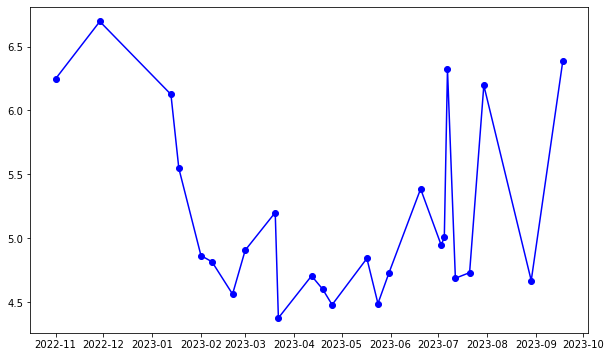

In [26]:
# Creating a line chart
plt.figure(figsize=(10, 6))
plt.plot(short_run_df['date'], short_run_df['average_pace'], marker='o', linestyle='-', color='b')

As we assumed, it seems like my average pace has been decreasing throughout the past year. From November 2022 to mid-February 2023, there has been a sharp decline in average pace. This might be because I have started running with friends who gave some constructive feedback on how to improve my run, which in turn made me run faster. However, around July and August, there are two outliers. One of them is due to a disinterested run that I logged for the sake of running, whereas the other one is due to a low mood run that I logged after an argument I had with my boyfriend! Despite these two outliers, from mi September 2023, there has been a repetitive rhythm of ups and downs throughout the rest of the year, with average paces steadily oscillating between 4:30 /km and 5:00 /km. This might have been because I set myself the goal of performing my running performance for the Trail Half Marathon in June, thus aimed at running my 5km runs better and faster.

# Exploring Routes

Now that we've created some charts to analyse my running data, it would be good to look at the routes of my runs and cycling activities on a map. Strava routes are stored in GPX files (i.e., GPS Exchange Format), a standard file format usually used to store and exchange GPS data and tracks (e.g., longitude, latitude, and elevation data). To bulk export my files, I used [this](https://support.strava.com/hc/en-us/articles/216918437-Exporting-your-Data-and-Bulk-Export#h_01GG58HC4F1BGQ9PQZZVANN6WF) article found on the Strava webpage, where I could find the instructions on how to export an archive of my account. Since GPX Files are usually packed in a zip file, I coded a way to unzip them and store them in a separate GPX Files directory before using them. Moreover, some files had '.fit' extension, so we could ignore those. Even if some other files has the '.gpx' file extension, they also had an extra '.gz' one. So I created a function that could remove such extension from the files before storing them in the new GPX directory. This will eventually help us answer our fourth and last research question: "In which country/ county did I exercise the most in the past years?"

# Moving GPX Files into a GPX Files Directory

In [27]:
# Importing the necessary libraries
import gzip
import shutil
import os

In [28]:
# Creating a directory of the activities 
activities_directory = '/Users/giorgiadimiccoli/Desktop/export_93529569/activities'

# Creating a new directory to store all the gpx files 
gpx_files = '/Users/giorgiadimiccoli/Desktop/export_93529569/gpx_files'

In [29]:
# Looping over the 'activities' directory to extract the gpx files and cleanse the gz files 
for file in os.listdir(activities_directory): # listing all files in the 'activities' directory with the listdir() function
    
    # Creating the file path by combining its name to the 'activities_directory'
    file = activities_directory + "/" + file
    
    # Checking if the data in the directory is a file
    if os.path.isfile(file):
    
    # Checking if the file has a .fit extension
        if file.endswith('.fit'):
    
    # Ignoring all files which contain a .fit extension
            continue 
    
    # Checking if the file has both a .gpx and .gz extension    
        if '.gpx' in file and file.endswith('.gz'): # Not using the 'endswith' function since some files contain .gpx but may end with .gz
    
    # Reading in the bytes of the file 
            with gzip.open(file, 'rb') as f_in:
    
    # Writing the bytes of the file and removing the '.gz' extension 
                with open(file.replace("activities", "gpx_files").replace(".gz", ""), 'wb') as f_out:
    
    # Copying the content of the file with shutil
                    shutil.copyfileobj(f_in, f_out) 
    
    # Checking if the file has a .gpx and does not have a .gz extension
        if '.gpx' in file and not file.endswith('.gz'):
    
    # Moving the file from the 'activities' directory to the 'gpx_files' directory 
            shutil.move(file, file.replace("activities", "gpx_files"))

Now that we've cleansed and stored all the GPX files in a new directory, we can iterate through each file path and turn them into a dataframe to better manipulate and analyse each activity's track.

In [30]:
# Creating a function that takes in a file path and returns a dataframe
def gpx_files_to_df(file_path):
    
    # Parsing the gpx file 
    gpx = gpxpy.parse(open(file_path))   
    
    # Creating an empty list for each info we want to store in the df 
    lats = []
    longs = []
    elevs = []
    times = []
    
    # Iterating through each point in the segment of the track of the gpx file
    for point in gpx.tracks[0].segments[0].points:
    
    # Appending each info from the point to the correspondent empty list
        lats.append(point.latitude)
        longs.append(point.longitude)
        elevs.append(point.elevation)
        times.append(point.time)
        
    # Creating a dataframe with the information as names of the columns 
    my_df = pd.DataFrame.from_dict(
    {
        "longitude": longs,
        "latitude": lats,
        "elevation": elevs,
        "time": times,
    }
    )
    return my_df

In [31]:
import gpxpy

# Creating an empty list of dataframes
list_of_dfs = []

# Looping over each file
for file in os.listdir(gpx_files): # Listing all the files in the 'gpx_files' directory
    # Creating the file path by combining its name to the 'gpx_files'
    file = gpx_files + "/" + file
    # Applying the 'gpx_files_to_df' function to the file and assigning the result to 'dfed_file'
    dfed_file = gpx_files_to_df(file)
    # Appending all the 'dfed_file'(s) to the list of empty dataframes 
    list_of_dfs.append(dfed_file)

Now it's time to create our maps! We can do that by importing folium, a package that allows us to create interactive geographic visualisations.

# Creating Maps and Strava Routes

In [32]:
# Using geospatial analysis to visualize my Strava routes with the folium package
import folium

route_map = folium.Map( # creating a map through folium.Map 
    location=[51.752457, -1.230000], # giving coordinates 
    zoom_start=13, # setting where the zoom starts 
    tiles='OpenStreetMap', # setting the map tile 
    width='100%', # choosing the width of the map 
    height='100%' # choosing the height of the map 
)

In [33]:
# Creating a map of the routes 
for df in list_of_dfs:
    for _, row in df.iterrows(): # Iterating through each row in the first dataframe from the list of dataframes 
        folium.CircleMarker( # dding a circle marker at each longitude and latitude combination
            location=[row['latitude'], row['longitude']],
            radius=3, # setting the circle radius to 3 
        ).add_to(route_map) # adding the markers to the map 

It looks like the majority of my activities in the past year has been performed the Oxfordshire county, which is the area where I'm currently living in. Some other activities have been performed in Wales due to trail half marathons, in Cambridge where I used to live, and in Jordan where I went on vacation last spring.

In [34]:
# Connecting circle markers in a polygon line to properly represent the route 
route_map = folium.Map( # creating a map through folium.Map 
    location=[51.752457, -1.230000], # giving coordinates of Oxford to start with 
    zoom_start=13, # setting where the zoom starts 
    tiles='OpenStreetMap', # adjusting the map tile to make the route stand out more 
    width='100%', # choosing the width of the map 
    height='100%' # choosing the height of the map 
)

# Creating a nested for loop to connect the circle markers
for df in list_of_dfs: # iterating through the list of dataframes
    for row in df: # looping through each row in the dataframe we are iterating through 
        coordinates = [tuple(x) for x in df[['latitude', 'longitude']].to_numpy()] # Extracting geolocation info as a list of tuples 
        folium.PolyLine( # Creating the polylines with the list of tuples
            coordinates,
            weight=3 # choosing the line thickness in pixels
        ).add_to(route_map) # adding them back to the route_map 

## Showing My Strava Routes

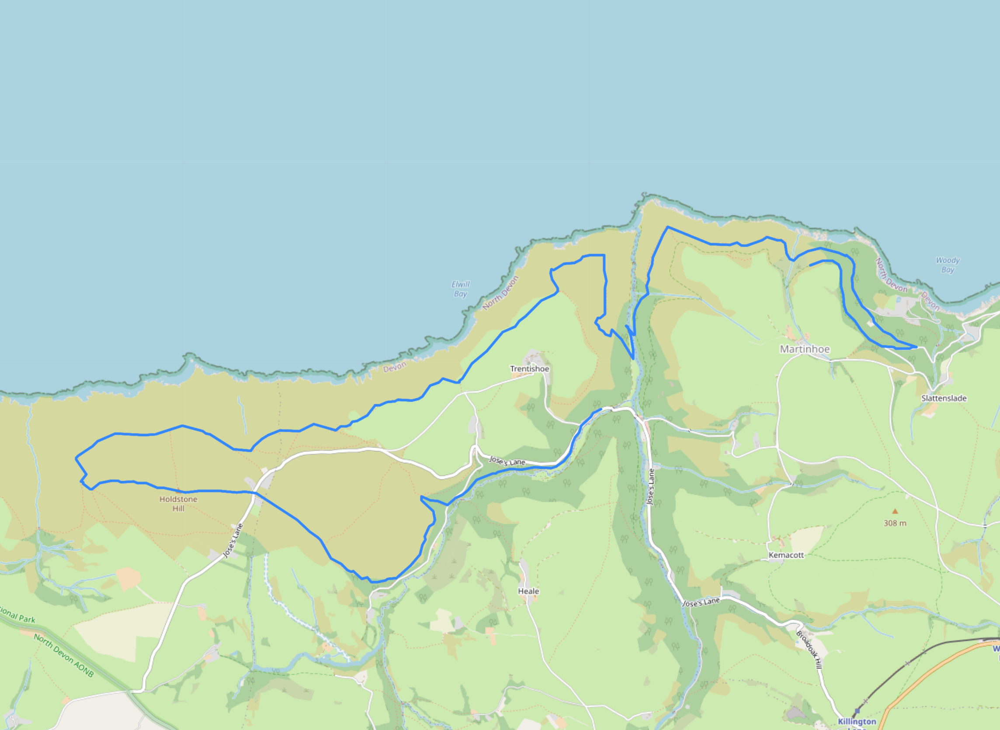

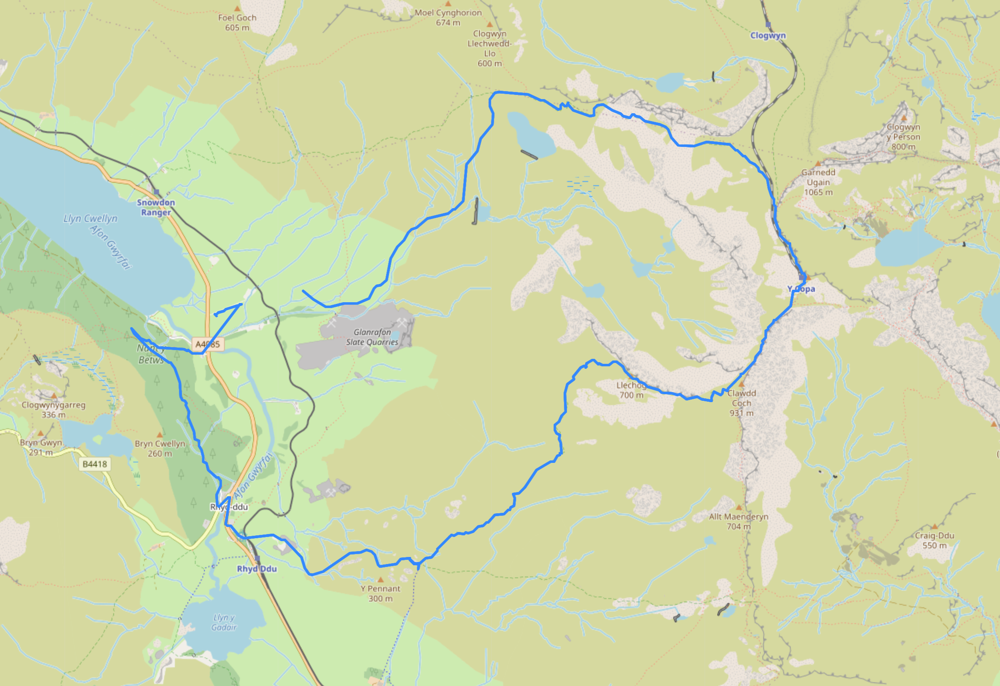

In [35]:
# Getting the current working directory (root directory)
root_directory = os.getcwd()

# Iterating over all files in the root directory
for filename in os.listdir(root_directory):
    # Checking if the file has an Open Street Map tile layer
    if "_openstreetmap_" in filename:
        # Displaying the Open Street Map images using IPython.display.Image
        img_path = os.path.join(root_directory, filename)
        display(Image(filename=img_path))

Here above, we can see the routes of my Strava activities on the maps of Amman, Cambridge, Snowdonia, Exmoor, Bath, and Oxfordshire. 

To reduce as much noise as possible and make our map neater, let's plot a map with a different tile layer named 'CartoDBPositron'. This adds a map tile layer from CartoDB's Positron map style to our map. CartoDB is a platform for spatial data visualization and analysis, whereas Positron is one of their map styles. Let's apply this tile layer on the Oxfordshire map, since it's the one which the highest density of activities. Just as done above, I'm going to share a screenshot of the plotted map for simplicity. 

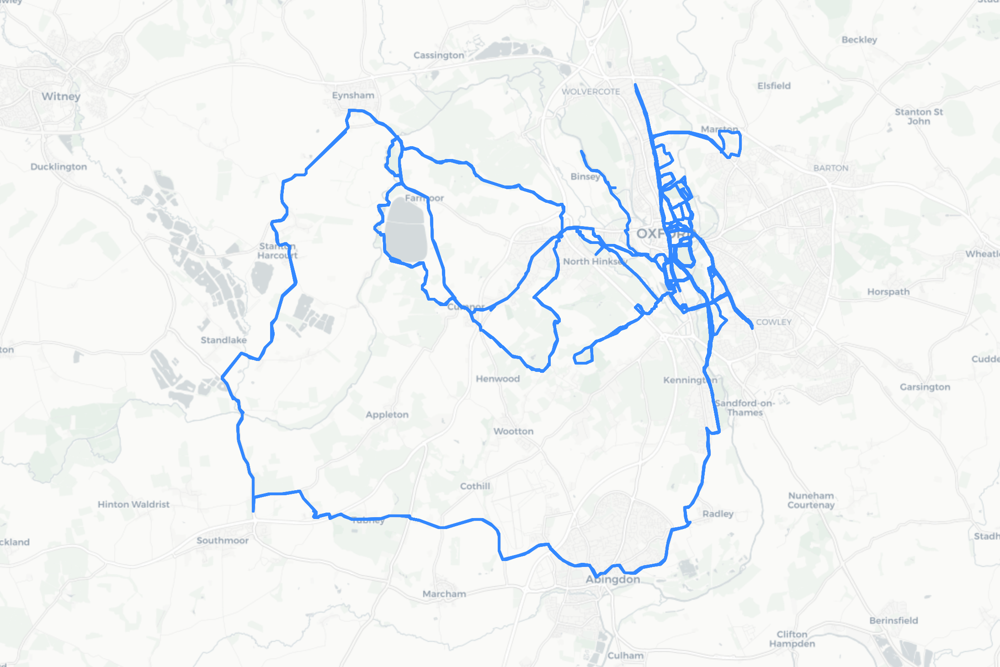

In [36]:
display(Image(filename='oxf_map_card_screenshot.png'))

We can now also attempt at creating a dark map with the tile layeer `'CartoDBDark_Matter'`. Let's do that for the Cambridge data, since it has an interesting shape.

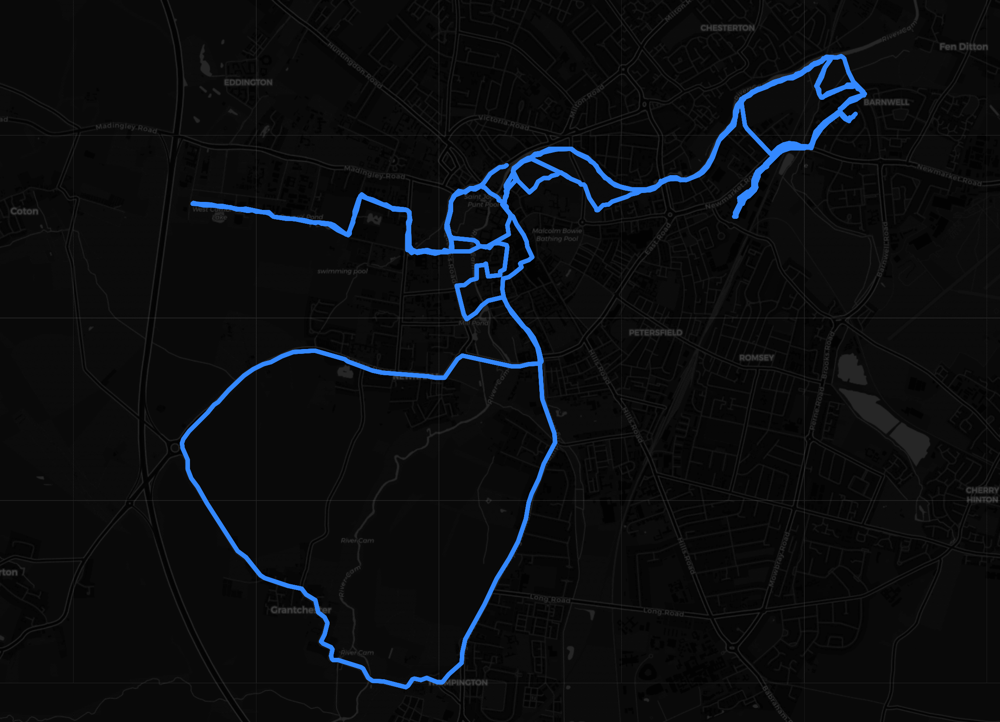

In [37]:
display(Image(filename='cam_dark_map_screenshot.png'))

# Conclusion

The purpose of this project was to explore my physical exercise activities performed throughout the past few years. We scraped Strava APIs and uploaded the data on my local JupyterLab to explore it, cleanse it, and analyse it. 

Here's what we've discovered so far:
    
- What's the most frequent activity that I've performed in the past six months? Running activities because of training for half marathons. 
- What's the most common run distance I've performed in the past few years? 5km distance because it is more convenient to run shorter distance due to a busy lifestyle. 
- Has my average pace decreased during my fast, 5km runs throughout the past year? From November 2022 to mid-February 2023, there has been a sharp decline in average pace. From then up to September 2023, there has been a repetitive rhythm of ups and downs throughout the rest of the year, with average paces steadily oscillating between 4:30 /km and 5:00 /km. This might have been because I set myself the goal of performing my running performance for the Trail Half Marathon in June, thus aimed at running my 5km runs better and faster.
- In which country/ county did I exercise the most in the past years? Oxfordshire county, with some runs across Cambridgeshire, Exmoor, Bath, Wales, and Jordan.

Recommendations for further data exploration include:
- Designing time series visualisations to track my fitness progress over time, including metrics such as heart rate and calories burned. 
- Creating a radar chart or parallel coordinate plots to compare my performance with the one of my partner or my friends across different statistical categories.
- Building a chart to compare the rankings of different teams during padel tournaments based on multiple performance metrics such as defense, offense, or overall rating. 